### Μηχανική Μάθηση 
#### 2η ατομική εργασία 
ΣΗΜΜΥ- ΕΜΠ - 7ο εξάμηνο -Ακ. Έτος 2022-23



# ⚠️
`Επισημαίνεται ότι απαγορεύεται η ανάρτηση των λύσεων των εργαστηριακών ασκήσεων στο github, ή σε άλλες ιστοσελίδες. Η σχεδίαση και το περιεχόμενο των εργαστηριακών projects αποτελούν αντικείμενο πνευματικής ιδιοκτησίας της διδακτικής ομάδας του μαθήματος.`

### Εισαγωγή
Στην άσκηση αυτή θα χρησιμοποιήσετε τη μέθοδο συσταδοποίηση k-means, καθώς και την μέθοδο μείωσης διαστατικότητας PCA σε υπερφασματική εικόνα. 

Ονοματεπώνυμο φοιτητή: Αχιλλέας Τσιμιχόδημος

Α.Μ.: 03119140

### 1. Φόρτωση υπερφασματικής εικόνας

Κατεβάστε την υπερφασματική εικόνα [`salinas_image.npy`](https://drive.google.com/file/d/1NaVn4BpaGmyN3UJOQhTGgMlfznnKhWdD/view?usp=share_link) και τις αντίστοιχες επισημειώσεις [`salinas_labels.npy`](https://drive.google.com/file/d/1u05ZSU8ptz9ZWCi4WuenqG8KuAh981LZ/view?usp=share_link).

1.α. Φορτώστε την εικόνα με χρήση της συνάρτησης numpy.load

In [1]:
import numpy as np

image = np.load("salinas_image.npy")

1.β. Χρησιμοποιώντας την ίδια συνάρτηση, φορτώστε τις αντίστοιχες επισημειώσεις ανά πίξελ εικόνας `salinas_labels.npy`. Οι επισημειώσεις αυτές αντιστοιχούν κάθε πιξελ της υπερφασματικής εικόνας σε ένα τύπο από 16 διαφορετικές καλλιέργειες (η επισημείωση 0 αντιστοιχεί σε "Undefined"):
```python
crop_type = ["Undefined", "Brocoli_green_weeds_1", "Brocoli_green_weeds_2", "Fallow","Fallow_rough_plow", "Fallow_smooth", "Stubble","Celery", "Grapes_untrained","Soil_vinyard_develop","Corn_senesced_green_weeds","Lettuce_romaine_4wk", "Lettuce_romaine_5wk",
        "Lettuce_romaine_6wk", "Lettuce_romaine_7wk", "Vinyard_untrained", "Vinyard_vertical_trellis"]
```

In [2]:
image_labels = np.load("salinas_labels.npy")

### 2. Οπτικοποίηση και Διερευνητική ανάλυση δεδομένων 

Παρουσιάστε με χρήση κώδικα πληροφορίες για τα εξής:

2α. Βρείτε το ύψος και το πλάτος της εικόνας, καθώς και τον αριθμό των υπερφασματικών καναλιών

2β. Σχεδιάστε με χρήση της matplotlib το 3ο, 65ο, και 155ο κανάλι της εικόνας

2γ. Υπολογίστε τον αριθμό των διαφορετικών κατηγοριών καλλιέργειας στις επισημειώσεις

2δ. Σχεδιάστε με χρήση της matplotlib τις επισημειώσεις. Προσθέστε επιπλέον επεξηγηματική λεζάντα με χρήση της βιβλιοθήκης κάθε επισημείωσης (χρησιμοποιήστε τη λίστα `crop_type` που σας δόθηκε προηγουμένως.

2ε. Υπολογίστε πόσα pixel της εικόνας αντιστοιχούν σε κάθε τύπο καλλιέργειας

In [3]:
# 2a

height = image.shape[0]
width = image.shape[1]
channels = image.shape[2]

print(f"Height: {height}, Width: {width}, Hyperspectral Channels: {channels}")

Height: 512, Width: 217, Hyperspectral Channels: 204


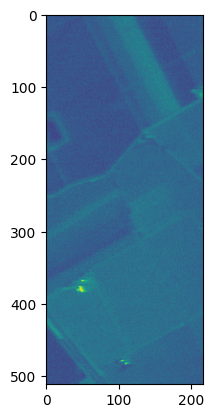

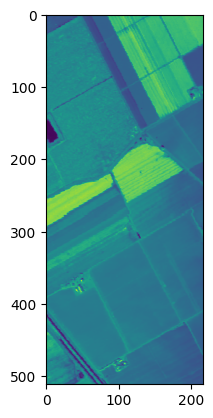

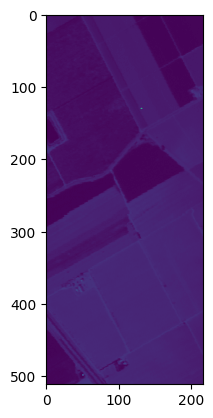

In [4]:
# 2b

import matplotlib.pyplot as plt

channel3 = image[:,:, 2]
channel65 = image[:,:, 64]
channel155 = image[:, :, 154]

plt.imshow(channel3)
plt.show()
plt.imshow(channel65)
plt.show()
plt.imshow(channel155)
plt.show()

In [5]:
# 2c

number_of_labels = np.unique(image_labels).size

print(f"The number of different categories, including 'Undefined', is: {number_of_labels}")

The number of different categories, including 'Undefined', is: 17


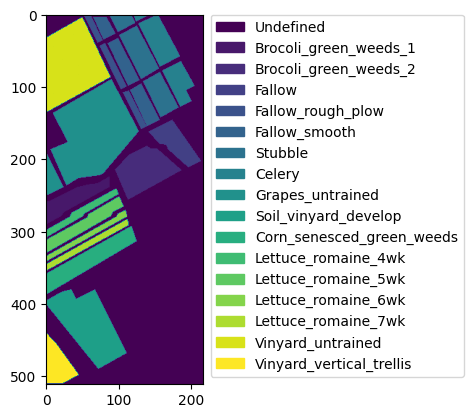

In [6]:
# 2d

import matplotlib.patches as mpatches

crop_type = ["Undefined", "Brocoli_green_weeds_1", "Brocoli_green_weeds_2", "Fallow","Fallow_rough_plow", "Fallow_smooth", "Stubble","Celery", "Grapes_untrained","Soil_vinyard_develop","Corn_senesced_green_weeds","Lettuce_romaine_4wk", "Lettuce_romaine_5wk", "Lettuce_romaine_6wk", "Lettuce_romaine_7wk", "Vinyard_untrained", "Vinyard_vertical_trellis"]
values = np.unique(image_labels.ravel())


im = plt.imshow(image_labels)

colors = [ im.cmap(im.norm(value)) for value in values]
patches = [ mpatches.Patch(color=colors[i], label=crop_type[values[i]] ) for i in range(len(values)) ]
plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0. )

plt.show()


In [7]:
# 2e

count = []
for i in range(number_of_labels):
    n = np.count_nonzero(image_labels == i)
    count.append({crop_type[i]: n})

print(count)

[{'Undefined': 56975}, {'Brocoli_green_weeds_1': 2009}, {'Brocoli_green_weeds_2': 3726}, {'Fallow': 1976}, {'Fallow_rough_plow': 1394}, {'Fallow_smooth': 2678}, {'Stubble': 3959}, {'Celery': 3579}, {'Grapes_untrained': 11271}, {'Soil_vinyard_develop': 6203}, {'Corn_senesced_green_weeds': 3278}, {'Lettuce_romaine_4wk': 1068}, {'Lettuce_romaine_5wk': 1927}, {'Lettuce_romaine_6wk': 916}, {'Lettuce_romaine_7wk': 1070}, {'Vinyard_untrained': 7268}, {'Vinyard_vertical_trellis': 1807}]


### 3. Εύρεση φασματικών υπογραφών

3.α. Μετατρέψτε την υπερφασματική εικόνα και τις επισημειώσεις σε μορφή κατάλληλη για περαιτέρω επεξεργασία. Η εικόνα θα πρέπει να μετατραπεί σε πίνακα N x Κ, όπου Ν τα pixel και K ο αριθμός των καναλιών. Οι επισημειώσεις αντίστοιχα θα πρέπει να μετατραπούν σε διάνυσμα μήκους Ν. Στη συνέχεια, "διώχτε" όσα δεδομένα είναι επισημειωμένα ως `Undefined`. 

💡 Χρησιμοποιήστε την `numpy reshape` 

In [8]:
N = 111104
K = 204

reshaped_image = np.reshape(image, (N, K))
reshaped_labels = np.reshape(image_labels, N)

defined_labels = reshaped_labels[np.nonzero(reshaped_labels)]
defined_image = np.delete(reshaped_image, np.where(reshaped_labels == 0), axis = 0)

3.β. Επιλέξτε ένα τυχαίο pixel της εικόνα από κάθε κατηγορία, είτε με προγραμματιστικό τρόπο, είτε χειροκίνητα.

In [9]:
import random

pixels = []

def pixels_from_labels(l):
    for i in range(16):
        indices = [j for j, k in enumerate(defined_labels) if k == i+1]
        l.append(random.choice(indices))
        

pixels_from_labels(pixels)
print(pixels)

[39017, 32516, 25035, 21079, 20324, 8038, 2690, 28634, 49382, 43516, 37209, 38887, 38918, 41638, 10522, 51437]


3.γ. Γράψτε κώδικα για να σχεδιάσετε την υπερφασματική υπογραφή των επιλεγμένων πίξελ. 

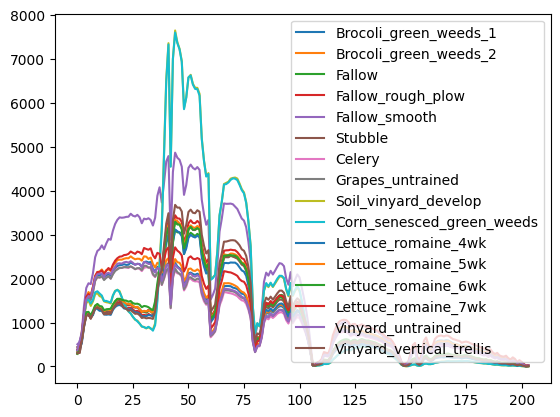

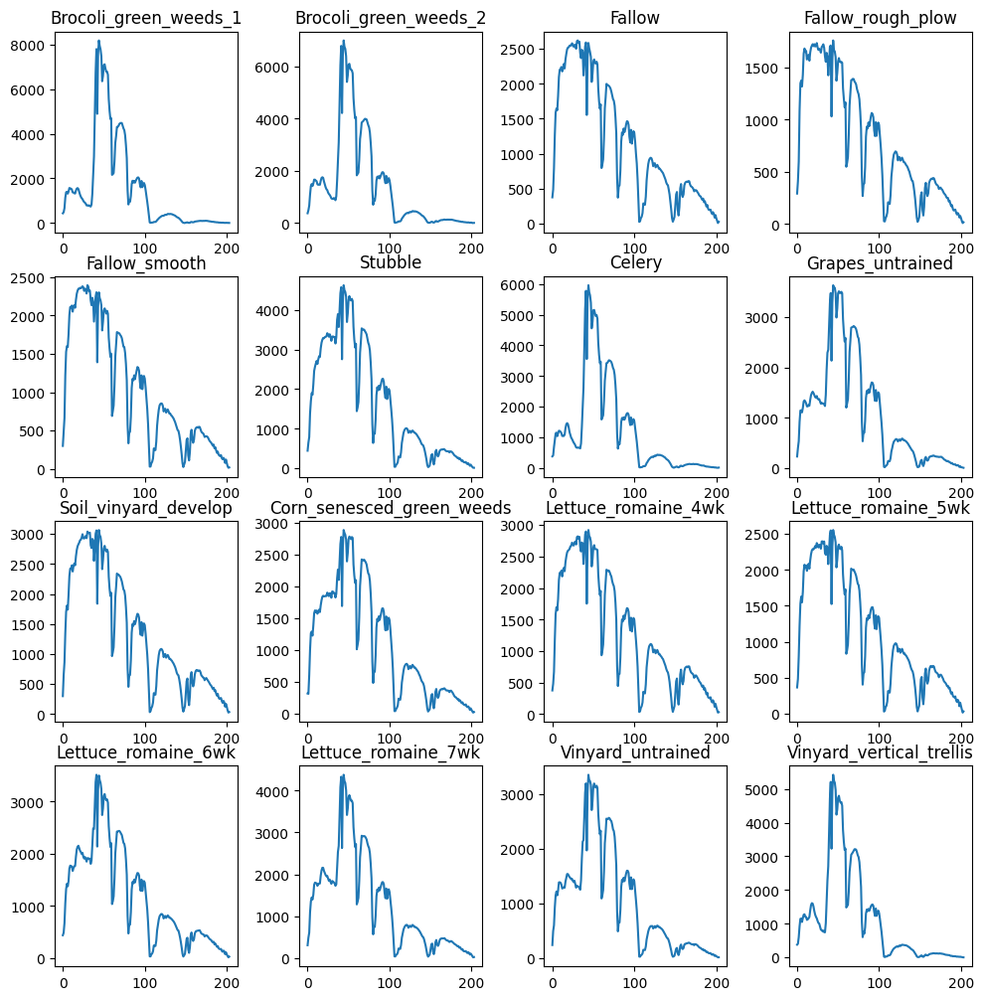

In [10]:
def plot_pixels(l):    
    for i in range(len(l)):
        plt.plot(reshaped_image[l[i]], label=crop_type[i+1])

    plt.legend()
    plt.show()

    fig, ax = plt.subplots(nrows=4, ncols=4, figsize=(10, 10))
    fig.tight_layout()

    for i in range(16):
        ax[i//4, i%4].plot(defined_image[l[i]])
        ax[i//4, i%4].set_title(f"{crop_type[i+1]}")
    plt.show()

plot_pixels(pixels)

3.δ. Επαναλάβετε την προηγούμενη διαδικασία άλλες δύο φορές, σχεδιάζοντας τα νέα διαγράμματα. 

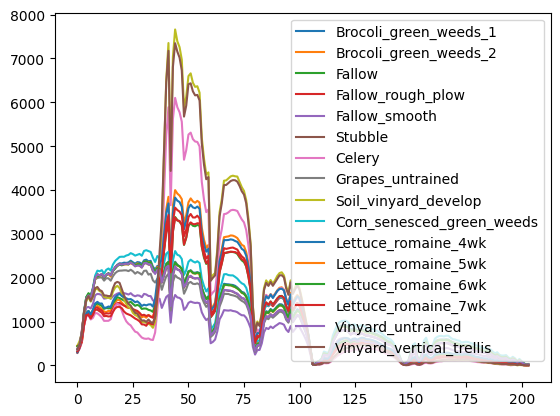

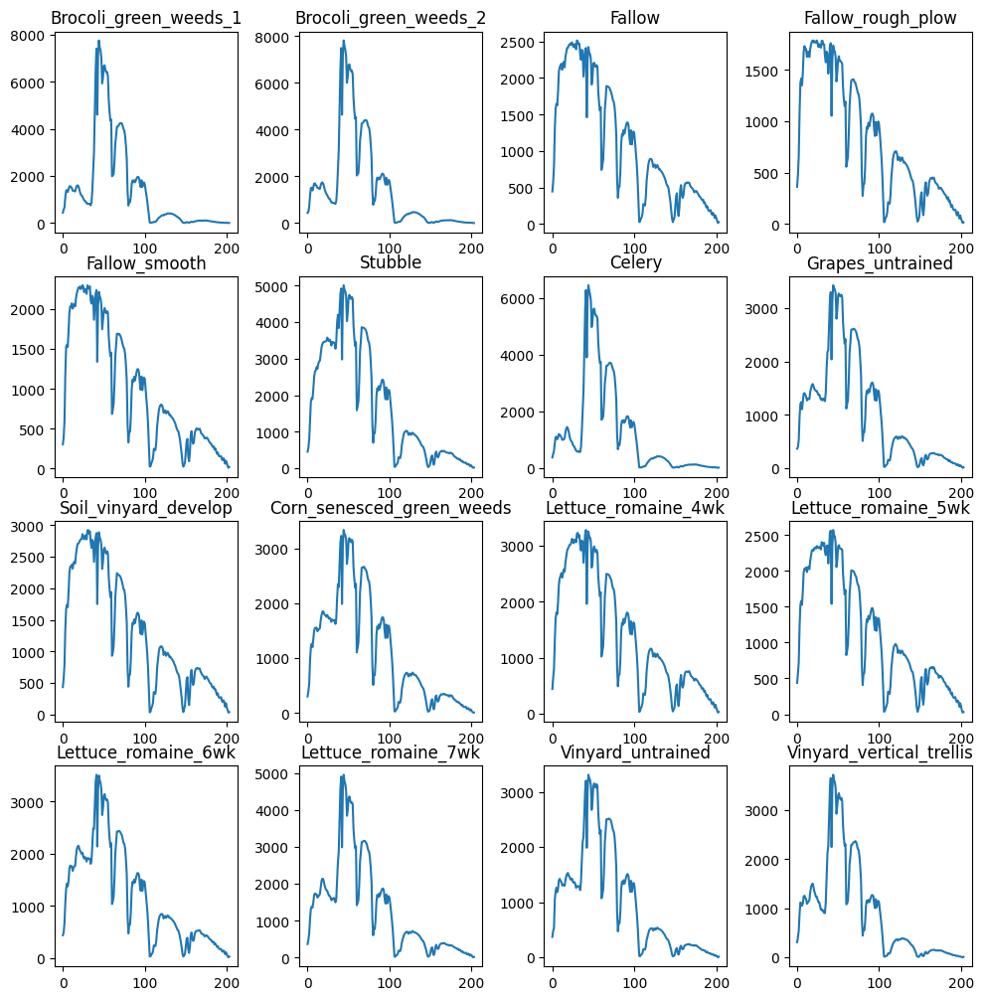

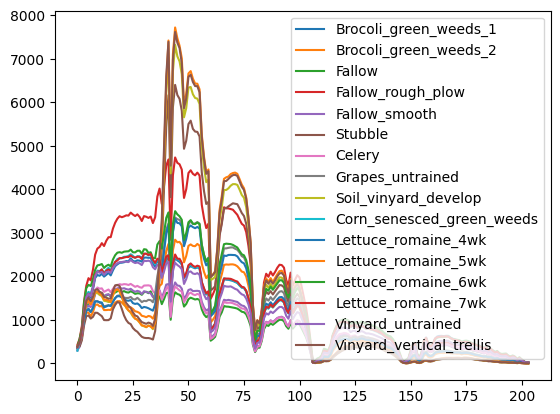

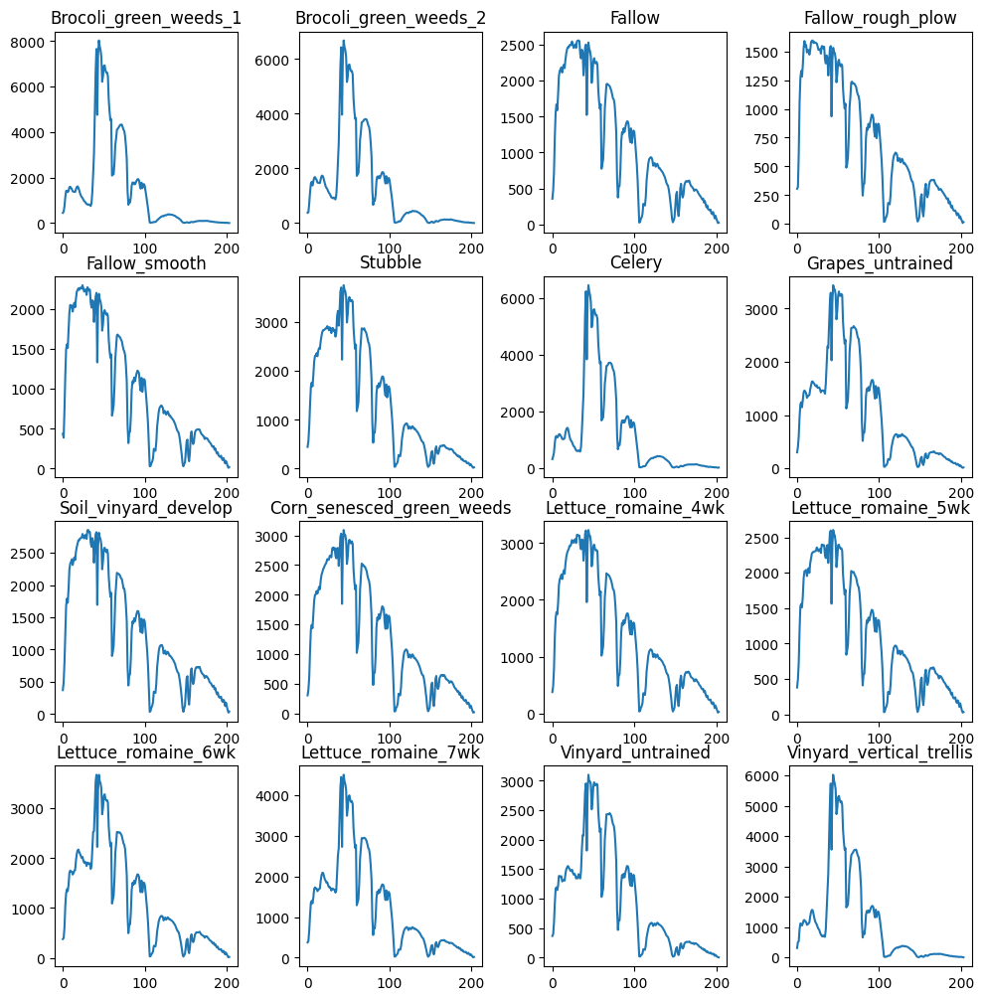

In [11]:
pixels2 = []
pixels3 = []

pixels_from_labels(pixels2)
plot_pixels(pixels2)

pixels_from_labels(pixels3)
plot_pixels(pixels3)

3.ε. Σημειώστε τις παρατηρήσεις σας και τα συμπεράσματα σας. Προσπαθήστε να απαντήσετε στις ακόλουθες ερωτήσεις:
    
* Με βάση τα προηγούμενα διαγράμματα θεωρείτε ότι κάποιες καλλιέργειες είναι πιο εύκολα διαχωρίσιμες από άλλες με βάση τη φασματική υπογραφή τους; 
* Θεωρείτε ότι όλα τα κανάλια παρέχουν χρήσιμη πληροφορία για το διαχωρισμό;

* Παρατηρώντας τα διαγράμματα των ερωτημάτων 3.γ και 3.δ, διαπιστώνουμε ότι ορισμένες καλλιέργειες είναι πιο εύκολα διαχωρίσιμες από άλλες με βάση τη φασματική τους υπογραφή, καθώς έχουν πολύ υψηλά (π.χ. 'Brocoli_green_weeds_1') ή πολύ χαμηλά (π.χ. 'Fallow_rough_plow') peaks σε σχέση με τις υπόλοιπες.

* Παρτηρούμε ότι η φασματική υπογραφή κάθε καλλιέργειας παρουσιάζει μεταβολές από κανάλι σε κανάλι, συνεπώς όλα τα κανάλια παρέχουν χρήσιμη πληροφορία για τον διαχωρισμό.

3.στ. Σχεδιάστε ένα heatmap, που να δείχνει τη συσχέτιση μεταξύ των διαφορετικών καναλιών

In [12]:
import seaborn as sn
import matplotlib.pyplot as plt
import pandas as pd

labeled_image = []
for i in range(16):
    indices = [j for j, k in enumerate(defined_labels) if k == i+1]
    labeled_image.append(defined_labels[indices])

In [13]:
import seaborn as sn
import matplotlib.pyplot as plt

df = pd.DataFrame(defined_image)
correlation = df.corr()
fig, ax = plt.subplots(figsize=(150,150))         # Sample figsize in inches
sn.heatmap(correlation,annot=True, ax=ax)

<AxesSubplot: >

### 4. Συσταδοποίηση με χρήση του αλγορίθμου KMeans

 4.α. Εφαρμόστε τον αλγόριθμο KMeans (sklearn.cluster) στα δεδομένα (εφόσον κάνατε την προεπεξεργασία του Βήματος 3). Χρησιμοποιήστε την τιμή `n_cluster=16`.

In [14]:
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs

k = 16
kmeans = KMeans(n_clusters=k, random_state=42)
y_pred = kmeans.fit_predict(defined_image)

/home/tsimiho/.local/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


4.β. Υπολογίστε τις ακόλουθες μετρικές των προβλέψεων του αλγορίθμου

* Accuracy Score
* Rand Score
* Silhouette Score 

Σημειώστε ότι για τη συνάρτηση rand_score μπορείτε να δώσετε σαν είσοδο τα αρχικά labels που σας δόθηκαν μαζί με τα predicted. Για τον υπολογισμό όμως του accuracy, θα πρέπει να αντιστοιχήσουμε τα διαφορετικά ID των cluster στην έξοδο του KMeans, με τις κατηγορίες της αρχικής επισημείωσης. Για την μετατροπή αυτή μπορείτε να χρησιμοποιήσετε την ακόλουθη συνάρτηση που σας δίνεται `translate_predicted_labels`.

In [15]:
from munkres import Munkres

def make_cost_matrix(c1, c2):
    """
    """
    uc1 = np.unique(c1)
    uc2 = np.unique(c2)
    l1 = uc1.size
    l2 = uc2.size
    assert(l1 == l2 and np.all(uc1 == uc2))

    m = np.ones([l1, l2])
    for i in range(l1):
        it_i = np.nonzero(c1 == uc1[i])[0]
        for j in range(l2):
            it_j = np.nonzero(c2 == uc2[j])[0]
            m_ij = np.intersect1d(it_j, it_i)
            m[i,j] =  -m_ij.size
    return m

def translate_clustering(clt, mapper):
    return np.array([ mapper[i] for i in clt ])

def accuracy(cm):
    """computes accuracy from confusion matrix"""
    return np.trace(cm, dtype=float) / np.sum(cm)


def translate_predicted_labels(predicted_y, y):
    cost_matrix = make_cost_matrix(predicted_y, y)
    m = Munkres()
    indexes = m.compute(cost_matrix)
    mapper = { old: new for (old, new) in indexes }

    # for old, new in mapper.items():
    #     print("map: %s --> %s" %(old, new))

    translated_predicted_y = translate_clustering(predicted_y, mapper)
    return translated_predicted_y

# usage:
# translate_predicted_labels(predicted, gt)
# predicted: N, array of predicted labels (predicted cluster IDs)
# gt: N, array of ground truth classes

In [16]:
from sklearn.metrics.cluster import rand_score
from sklearn.metrics import accuracy_score, silhouette_score

translated = translate_predicted_labels(y_pred, defined_labels-1)

RandScore = rand_score(y_pred, defined_labels)
AccuracyScore = accuracy_score(translated,defined_labels-1)
SilhouetteScore = silhouette_score(defined_image, y_pred)

print(f'RandScore: {RandScore}, AccuracyScore: {AccuracyScore}, SilhouetteScore: ')

RandScore: 0.9054169776881031, AccuracyScore: 0.5817768663747713, SilhouetteScore: 


4.δ. Σχεδιάστε το confusion matrix (χρησιμοποιήστε τα αντιστοιχησμένα predicted labels).

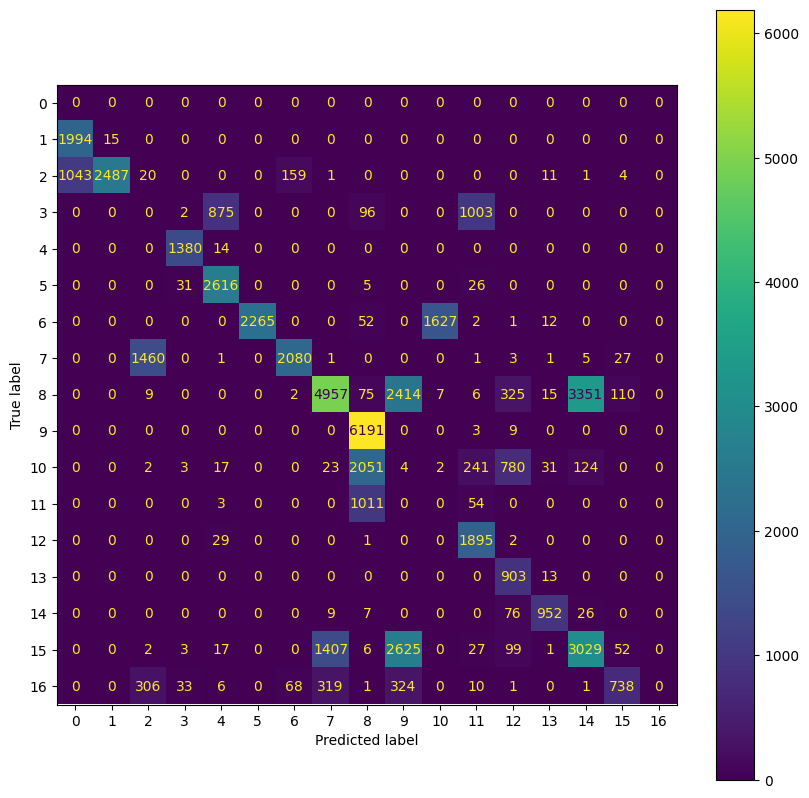

In [17]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(defined_labels, translated)

fig, ax = plt.subplots(figsize=(10,10))         # Sample figsize in inches
cm_display = ConfusionMatrixDisplay(confusion_matrix = cm)

cm_display.plot(ax=ax)
plt.show() 

### 5. Μείωση διαστατικότητας δεδομένων

5.α. Εφαρμόστε στα δεδομένα τη μέθοδο μείωσης διαστατικότητας PCA. Επιλέξτε `n_components=3`

In [18]:
from sklearn.decomposition import PCA

pca = PCA(n_components=3)
pca_image = pca.fit_transform(defined_image)

5.β. Τι ποσοστό της διακύμανσης των δεδομένων διατηρείτε με `n_components=3` ?
Hint: sklearn.decomposition.PCA.explained_variance_ratio_

In [19]:
evr = pca.explained_variance_ratio_

print(f'Διατηρούμε {sum(evr)} % της διακύμανσης των δεδομένων')

Διατηρούμε 0.994684101712945 % της διακύμανσης των δεδομένων


### 6. Συνδυασμός μείωσης διαστατικότητας και kmeans

6.α. Εφαρμόστε τον αλγόριθμο kmeans στα δεδομένα μειωμένης διαστατικότητας `n_components=3`, και υπολογίστε εκ νέου τις μετρικές του Βήματος 4.γ.

In [20]:
pca_y_pred = kmeans.fit_predict(pca_image)

pca_translated = translate_predicted_labels(pca_y_pred, defined_labels-1)

RandScore_pca = rand_score(pca_y_pred, defined_labels)
AccuracyScore_pca = accuracy_score(pca_translated,defined_labels-1)
SilhouetteScore_pca = silhouette_score(defined_image, pca_y_pred)

print(f'RandScore: {RandScore_pca}, AccuracyScore: {AccuracyScore_pca}, SilhouetteScore: {SilhouetteScore_pca}')

/home/tsimiho/.local/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


RandScore: 0.9110608348072841, AccuracyScore: 0.6283323172421438, SilhouetteScore: 0.4301481197518064


6.β. Δοκιμάστε διαφορετικές τιμές για το `n_components` (από 1 έως 10) και τρέχτε εκ νέου κάθε φορα τον k-means, υπολογίζοντας τα τελικά score. Για κάθε μετρική, φτιάχτε ένα διάγραμμα που στον άξονα των Χ θα έχει τον αριθμό `n_components` και στον άξονα των Υ, την τιμή της μετρικής. Τι συμπεράσματα βγάζετε; 

In [ ]:
random_scores = []
accuracy_scores = []
silhouette_scores = []

for i in range(10):
    new_pca = PCA(n_components=i+1)
    new_pca_image = new_pca.fit_transform(defined_image)

    test_y_pred = kmeans.fit_predict(new_pca_image)

    test_translated = translate_predicted_labels(test_y_pred, defined_labels - 1)

    RandScore_test = rand_score(test_y_pred, defined_labels)
    AccuracyScore_test = accuracy_score(test_translated,defined_labels-1)
    SilhouetteScore_test = silhouette_score(defined_image, test_y_pred)

    random_scores.append(RandScore_test)
    accuracy_scores.append(AccuracyScore_test)
    silhouette_scores.append(SilhouetteScore_test)

for i in range(10):
    print(f'Random score for n = {i+1}: {random_scores[i]}')

for i in range(10):
    print(f'Accuracy score for n = {i+1}: {accuracy_scores[i]}')

for i in range(10):
    print(f'Silhouette score for n = {i+1}: {silhouette_scores[i]}')

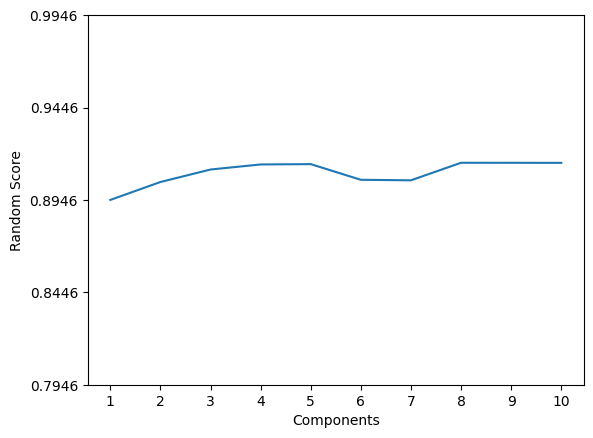

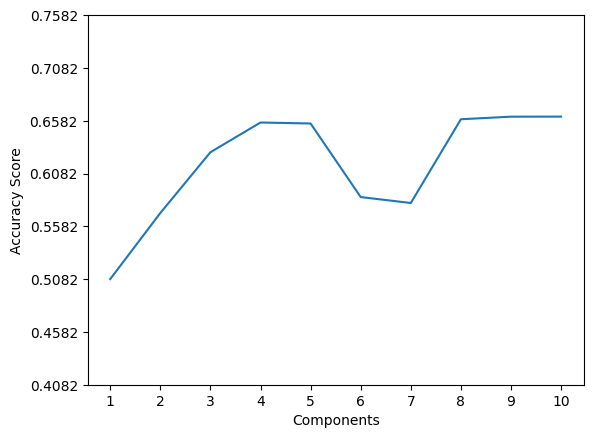

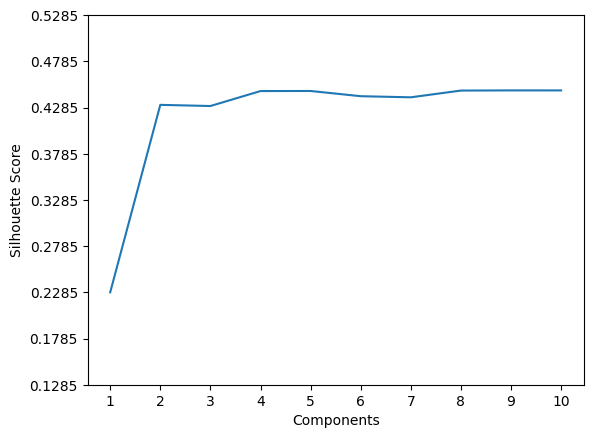

In [34]:
components = range(1,11)

plt.plot(components, random_scores)
plt.xticks(np.arange(min(components), max(components)+1, 1))
plt.yticks(np.arange(min(random_scores)-0.1, max(random_scores)+0.1, 0.05))
plt.xlabel('Components')
plt.ylabel('Random Score')
plt.show()

plt.plot(components, accuracy_scores)
plt.xticks(np.arange(min(components), max(components)+1, 1))
plt.yticks(np.arange(min(accuracy_scores)-0.1, max(accuracy_scores)+0.1, 0.05))
plt.xlabel('Components')
plt.ylabel('Accuracy Score')
plt.show()

plt.plot(components, silhouette_scores)
plt.xticks(np.arange(min(components), max(components)+1, 1))
plt.yticks(np.arange(min(silhouette_scores)-0.1, max(silhouette_scores)+0.1, 0.05))
plt.xlabel('Components')
plt.ylabel('Silhouette Score')
plt.show()

Παρατηρήσεις

* RandomScore: Το Random Score ομαλή αύξηση για καθώς το n αυξάνεται από 1 σε 4. Ωστόσο, για n >= 3, η τιμή του παραμένει πρακτικά αμετάβλητη, με εξαίρεση τη μικρή μείωση ου σημειώνεται στις τιμές n = 6, 7.

* Accuracy Score: Η καμπύλη του Accuracy Score παρουσιάζει σημαντική αύξηση για n μεταξύ 1 και 4 και για n >= 4 είναι αντίστοιχη με αυτή του Random Score, με τη μόνη διαφορά ότι παρουσιάζει σημαντικότερη μείωση στις τιμές n = 6, 7.

* Silhouette Score: Το Sihllouette Score έχει μέγιστο για n = 3, και για μεγαλύτερες τιμές, συμπεριλαμβανομένης και της τιμής n = 9, παραμένει πρακτικά σταθερό.


Συνεπώς, καταλήγουμε στο συμπέρασμα ότι η αύξηση των n_components πάνω από μία συγκεκριμένη τιμή (στην προκειμένη περίπτωση n = 4) στη μέθοδο μείωσης διαστατικότητας PCA δεν οδηγεί σε βελτίωση των διαφόρων μετρικών, και για ορισμένες τιμές (n = 6, 7) ενδέχεται να οδηγήσει στη μείωσή τους.